## This is a Colab notebook!

This notebook builds an end-to-end multi class image classifier using TenserFlow 2.0 and TenserFlow Hub.

## 1. Problem

Identifying the breed of dog given an image of dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning
* There are 120 breeds of dogs (this means there are 120 different classes).
* There around 10,000+ images in training set (these images have labels)
* There are 10,000+ images in test set (these images have no lables, because we'll want to predict them)

In [1]:
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification (1).zip" -d "/content/drive/MyDrive/Dog Vision/"
# so ! for terminal command then file path -d for destination path where we put that unzip file

<h1 style="color:red">lec 216:-Importing TenserFlow 2</h1>

### Get our workspace ready

* Import TenserFlow 2.x
* Import TenserFlow Hub
* Make sure we're using a GPU

In [2]:
# Import TenserFlow into Colab
import tensorflow as tf
print("TF version:",tf.__version__)

TF version: 2.19.0


<h1 style="color:red">lec 218:-Using a GPU</h1>

In [3]:
# Import necessary tools
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU","available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF Hub version: 0.16.1
GPU not available :(


https://colab.research.google.com/notebooks/gpu.ipynb

<h1 style="color:red">lec 220:-Optional Reloading Colab Notebook</h1>

https://cloud.google.com/vision/automl/object-detection/docs/prepare

<h1 style="color:red">lec 221:-Loading Our Data Labels</h1>

## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations)

Let's start by accessing our data and checking out the labels.

In [4]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

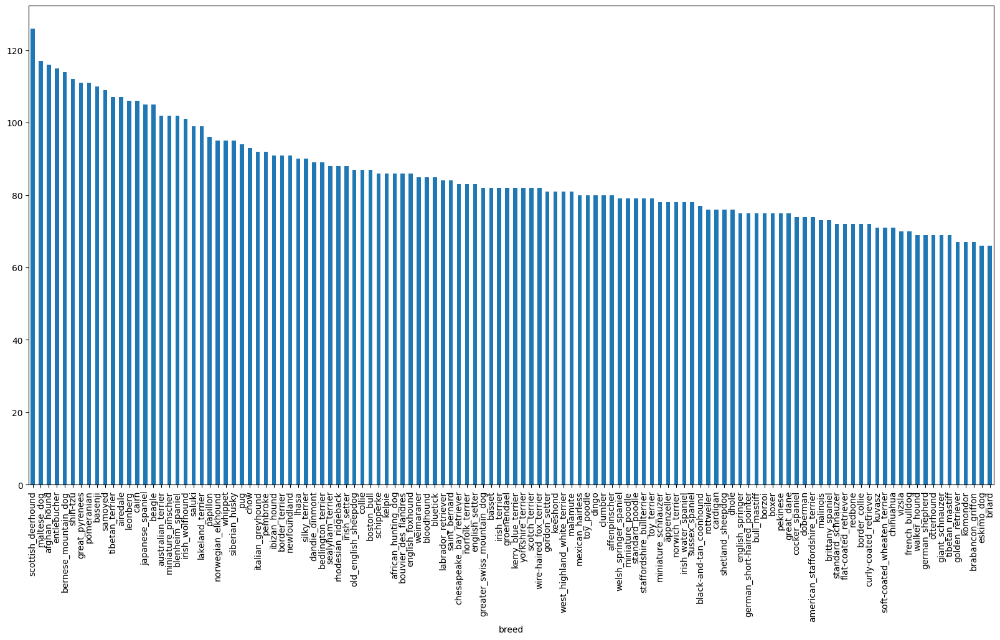

In [5]:
# How many images are there for each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv["breed"].value_counts().mean()

np.float64(85.18333333333334)

In [7]:
labels_csv["breed"].value_counts().median()

82.0

In [8]:
labels_csv["breed"].value_counts().mode()

,count
0,82


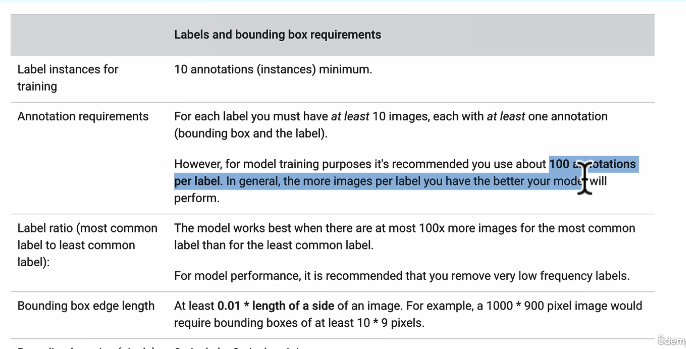

<h1 style="color:red">lec 222:-Preparing The Images</h1>

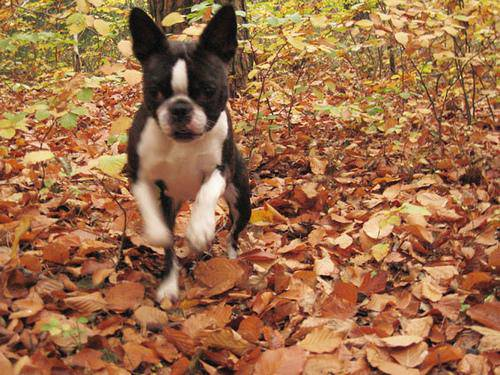

In [9]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting images and their labels

Let's get a list of all of our image file pathnames.

In [10]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [11]:
# Create pathnames from Image's ID
filenames = ["/content/drive/MyDrive/Dog Vision/train/" + fname +".jpg" for fname in labels_csv["id"]]

filenames[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [12]:
import os
os.listdir("/content/drive/MyDrive/Dog Vision/train/")[:10]

['e47cac448a3250262bee5660d393da9a.jpg',
 'e41d436e4f76b4c13a92abde03ae2721.jpg',
 'e8d0712b9ca47f77b333858183a38ef7.jpg',
 'e36f90b1dd7921dceb536c79989fe69f.jpg',
 'df3ba5eee0c008a3284158bb89350673.jpg',
 'e401d9046968cb01f5bdb97f92e61428.jpg',
 'e5fe6ce882c440a45354722376fdb770.jpg',
 'e960fc18473c0998c1ecbda887aa6bea.jpg',
 'de5e511f50c8e04008da3de616f254fc.jpg',
 'e593c0438ce45ae8abc32a8ad154e776.jpg']

In [13]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!


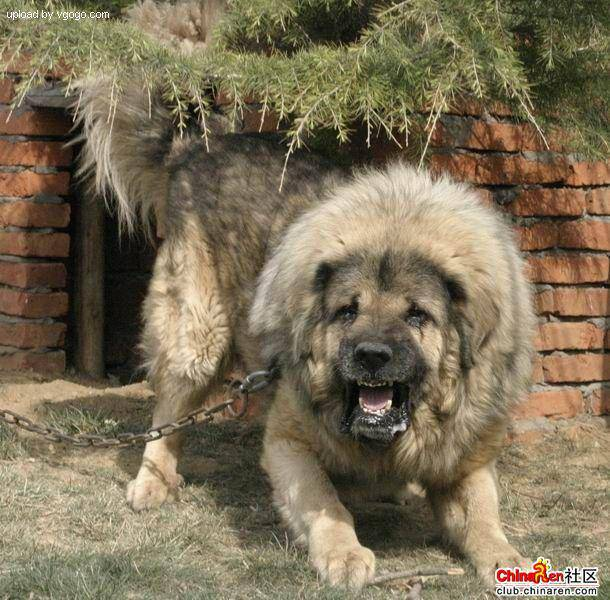

In [14]:
# One more check
Image(filenames[9000])

<h1 style="color:red">lec 223:-Turning Data Labels Into Numbers</h1>

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [15]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does samething as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [16]:
len(labels)

10222

In [17]:
# See if numbers of lables matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [18]:
from tensorflow.python.ops.array_ops import unique
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [19]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
from pandas.core.arrays import boolean
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
len(boolean_labels)

10222

In [22]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be one where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


<h1 style="color:red">lec 224:-Creating Our Own Validation Set</h1>

### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [23]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [24]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed

In [25]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [26]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)

len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [27]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

<h1 style="color:red">lec 225:-Preprocess Images</h1>

https://www.tensorflow.org/tutorials/load_data/images

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as an input
2. Use TenserFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be shape of (224,224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [28]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
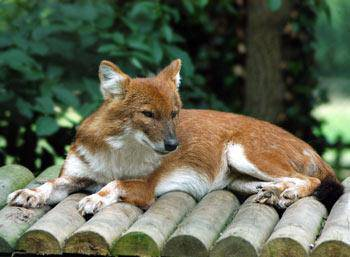

In [29]:
image

In [30]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [31]:
# turn image into a tensor (tensors run in gpu that's why very fast computing)

tf.constant(image) # Creates a constant tensor from a tensor-like object.
# Note: All eager tf.Tensor values are immutable (in contrast to
# tf.Variable). There is nothing especially _constant_ about the value
# returned from tf.constant.

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

https://www.tensorflow.org/guide/data

<h1 style="color:red">lec 226:-Preprocess Images 2</h1>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as an input
2. Use TenserFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values form 0-255 to 0-1)
5. Resize the `image` to be shape of (224,224)
6. Return the modified `image`

In [32]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path,img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red,Green,Blue)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values (normalization)
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

In [33]:
tensor = tf.io.read_file(filenames[26]) # return raw bytes in tensor format (TensorFlow tensor) just a byte buffer
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

<h1 style="color:red">lec 227:-Turning Data into Batches</h1>

google "yann lecun batch size" or "jeremy howard batch size".

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (batch size) images at a time (you can manually adjust the batch suze if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image,label)`

In [34]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label).
  """
  image = process_image(image_path)
  return image,label

In [35]:
# Demon of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

<h1 style="color:red">lec 228:-Turning Data Into Batches 2</h1>

Now we've got a way to turn our data into tuples of Tensors in the form of: `(image,label)`,let's make a function to turn all of our data (`x` & `y`) into batches!

In [36]:
# Define batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # lables
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

  return data_batch

In [37]:
# Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)


Creating training data batches...
Creating validation data batches...


In [38]:
# Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

<h1 style="color:red">lec 229:-Visualizing Our Data</h1>

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [39]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays 25 images from a data batch, and the true labels.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows,5 columns)
    ax = plt.subplot(5,5,i+1) # subplot and subplots are different
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [40]:
# currently our data in batches we need to unbatch it
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels # every time we do this images always different because we have shuffle in train set for valid set the images will remain same

(array([[[[0.5172732 , 0.6441289 , 0.48288944],
          [0.49152547, 0.6329471 , 0.46939647],
          [0.3896039 , 0.5500876 , 0.38449797],
          ...,
          [0.19353259, 0.18972787, 0.18171577],
          [0.25622377, 0.2523022 , 0.2440564 ],
          [0.3808576 , 0.37693602, 0.36869022]],
 
         [[0.5079914 , 0.6371228 , 0.47414148],
          [0.40571582, 0.5492203 , 0.3807856 ],
          [0.27094033, 0.4329852 , 0.26175755],
          ...,
          [0.3234815 , 0.32269335, 0.30965003],
          [0.29295626, 0.29024267, 0.27334842],
          [0.32606792, 0.32335433, 0.30646008]],
 
         [[0.48067614, 0.6224246 , 0.44573215],
          [0.36351934, 0.5120046 , 0.33410838],
          [0.24627493, 0.408904  , 0.22925164],
          ...,
          [0.32679695, 0.3323094 , 0.30491522],
          [0.27069768, 0.2756259 , 0.24706323],
          [0.2737152 , 0.27864343, 0.25008073]],
 
         ...,
 
         [[0.72152245, 0.72152245, 0.72152245],
          [0.83871

In [41]:
len(train_images), len(train_labels) # return batch size

(32, 32)

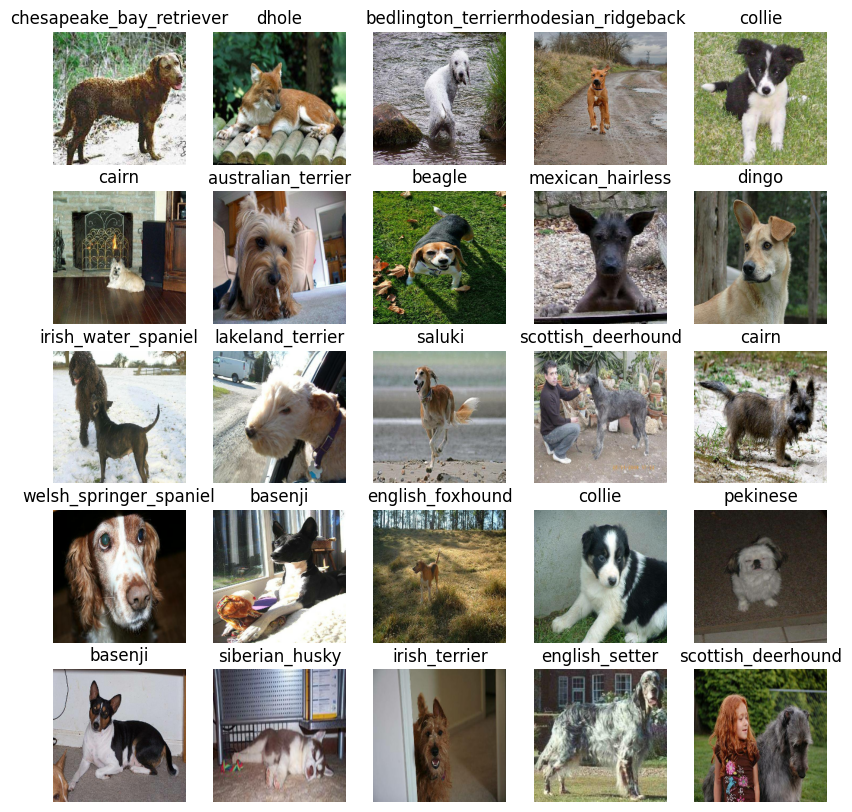

In [42]:
# Now let's visualize the data in a training batch
show_25_images(train_images,train_labels)

<h1 style="color:red">lec 230:-Preparing Our Inputs and Outputs</h1>

## Building a model

Before we build a model, there are a few things we need to define:
* The imput shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, int the form of Tensors) of our model.
* The URL of model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [43]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE, 3] # batch,height,width,color channels (batchsize(32),224,224,channels=3)

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = ...  # Search model link from here "https://tfhub.dev/"

<p>Massive effort getting the data ready for use with a machine learning model! This is one of the most important steps in any machine learning project.</p><p>Now you've got the data ready, you're about to dive headfirst into writing deep learning code with TensorFlow 2.x.</p><p>Since we're focused on writing code first and foremost, these videos are optional but they're here for those who want to start to get an understanding of what goes on behind the scenes.</p><p><strong>How Machines Learn</strong></p><p>The first is a video called <a href="https://www.youtube.com/watch?v=R9OHn5ZF4Uo" rel="noopener noreferrer" target="_blank">How Machines Learn by GCP Grey on YouTube</a>.</p><p>It's a non-technical narrative explaining how some of the biggest tech companies in the world use data to improve their businesses. In short, they're leveraging techniques like the ones you've been learning. Instead of trying to think of every possible rule to code, they collect data and then use machines to figure out the patterns for them.</p><p><strong>What actually is a neural network?</strong></p><p>You're going to be writing code which builds a neural network (a type of machine learning model) so you might start to wonder, what's going on when you run the code?</p><p>When you pass inputs (often data and labels) to a neural network and it figures out patterns between them, how is it doing so?</p><p>When it tries to make predictions and gets them wrong, how does it improve itself?</p><p>The <a href="https://www.youtube.com/watch?v=aircAruvnKk" rel="noopener noreferrer" target="_blank">deep learning series by 3Blue1Brown on YouTube</a> contains a technical deep-dive into what's going on behind the code you're writing.</p><p>Be warned though, it isn't for the faint of heart. The videos explain the topics in a beautiful way but it doesn't mean the topics aren't still difficult to comprehend.</p><p>If you're up for it, a good idea would be to watch 1 video in the series one day and then another the day after and so on.</p><p>Remember, you don't need to know all of these things to get started writing machine learning code. Focus on solving problems first (like we're doing in this project) and then dive deeper when you need to.</p><p>And since these videos are optional, feel free to bookmark them for now, continue with the course and come back later!</p><p>Links:</p><p>(Non-technical) How Machines Learn by GCP Grey: <a href="https://www.youtube.com/watch?v=R9OHn5ZF4Uo" rel="noopener noreferrer" target="_blank">https://www.youtube.com/watch?v=R9OHn5ZF4Uo</a></p><p>(Technical) Deep Learning series by 3Blue1Brown: <a href="https://www.youtube.com/watch?v=aircAruvnKk" rel="noopener noreferrer" target="_blank">https://www.youtube.com/watch?v=aircAruvnKk</a></p>




<hr>
<a href="https://youtu.be/oBklltKXtDE?t=173">Andrei Karpathys talk on AI at tesla.<a>

* 232 - MobileNetV2 the model were using on TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
* 232 - Papers with Code a great resource for some of the best machine learning papers with code examples - https://paperswithcode.com/
* 232 - PyTorch Hub PyTorch version of TensorFlow Hub - https://pytorch.org/hub/
* 232 - TensorFlow Hub resource for pretrained deep learning models and more - https://tfhub.dev/

<hr>
<br>
<bt>
<hr>


### Keras **Sequential API** vs **Functional API**

Both are ways to define models in Keras. The difference is **model topology complexity and flexibility**.

---

## 1. Sequential API

### What it is

A **linear stack of layers**.
One input → one output.
Each layer feeds directly into the next.

### Example

```python
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(224,224,3)),
    tf.keras.layers.Conv2D(32, 3, activation="relu"),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation="softmax")
])
```

### Characteristics

* Simple
* Easy to read
* Minimal boilerplate
* Good for beginners

### Limitations

* ❌ No branching
* ❌ No multiple inputs
* ❌ No multiple outputs
* ❌ Cannot access intermediate layers easily

### When to use

* Plain CNNs
* MLPs
* Binary / multiclass classifiers with straight flow

---

## 2. Functional API

### What it is

A **directed acyclic graph (DAG)** of layers.
Layers are functions applied to tensors.

### Example

```python
inputs = tf.keras.Input(shape=(224,224,3))
x = tf.keras.layers.Conv2D(32, 3, activation="relu")(inputs)
x = tf.keras.layers.MaxPooling2D()(x)
x = tf.keras.layers.Conv2D(64, 3, activation="relu")(x)

outputs = tf.keras.layers.Dense(10, activation="softmax")(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)
```

### Characteristics

* Explicit input/output tensors
* Flexible graph construction
* Clear data flow

---

## 3. What Functional API can do that Sequential cannot

### 1. Multiple inputs

```python
image_input = tf.keras.Input(shape=(224,224,3))
meta_input = tf.keras.Input(shape=(10,))

x = tf.keras.layers.Conv2D(32, 3)(image_input)
x = tf.keras.layers.Flatten()(x)

combined = tf.keras.layers.concatenate([x, meta_input])
output = tf.keras.layers.Dense(1)(combined)

model = tf.keras.Model([image_input, meta_input], output)
```

---

### 2. Multiple outputs

```python
output1 = tf.keras.layers.Dense(1, name="age")(x)
output2 = tf.keras.layers.Dense(10, activation="softmax", name="class")(x)

model = tf.keras.Model(inputs, [output1, output2])
```

---

### 3. Branching / merging

```python
x1 = tf.keras.layers.Conv2D(32, 3)(inputs)
x2 = tf.keras.layers.Conv2D(64, 5)(inputs)

x = tf.keras.layers.concatenate([x1, x2])
```

---

### 4. Skip connections (ResNet-style)

```python
x = tf.keras.layers.Conv2D(64, 3, padding="same")(inputs)
x = tf.keras.layers.add([x, inputs])
```

Impossible with Sequential.

---

## 4. Model introspection

Functional API lets you:

* Extract intermediate outputs
* Build sub-models

```python
feature_model = tf.keras.Model(
    inputs=model.input,
    outputs=model.get_layer("conv2d").output
)
```

Sequential makes this awkward or impossible.

---

## 5. Error detection

Functional API:

* Catches shape mismatches **at model construction time**

Sequential:

* Often fails only at runtime

---

## 6. Performance

No performance difference.
Both compile to the same TensorFlow graph.

---

## 7. Mental model (important)

* **Sequential**: list of layers
* **Functional**: graph of tensors

---

## 8. Which one should YOU use

* Learning / quick experiments → **Sequential**
* Real-world models → **Functional**
* Anything with:

  * multiple inputs
  * multiple outputs
  * skip connections
  * shared layers
    → **Functional**

---

## One-line summary

> Sequential is a straight line.
> Functional API is a graph.

Once you understand Functional API, Sequential becomes a special case of it.


<h1 style="color:red">lec 232:-Building A Deep Learning Model</h1>

In [44]:
# Setup input shape to the model
#INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE, 3] # batch,height,width,color channels (batchsize(32),224,224,channels=3)
INPUT_SHAPE = (224, 224, 3)
"""
✅ STEP 2 — FIX INPUT_SHAPE (this is critical)

❌ WRONG (what you have):

INPUT_SHAPE = [None, 224, 224, 3]


tf.keras.Input() never includes batch dimension.
"""


# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4"


<h1 style="color:red">lec 232:-Building A Deep Learning Model 2</h1>

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, outout shape and the model we've chosen as parameters.
* Define the layers in Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

# Q. why we're not using INPUT_SHAPE in our function below
<hr>
The reason `INPUT_SHAPE` is not explicitly used in your `Sequential` model is because **the `hub.KerasLayer` from TensorFlow Hub automatically infers the input shape**. Let me break it down clearly:

1. **`hub.KerasLayer(MODEL_URL)`**

   * This is a pretrained model (like MobileNet, BERT, etc.) loaded from TensorFlow Hub.
   * Most TF Hub models already have a fixed expected input shape.
   * When you pass this layer as the first layer in a `Sequential` model, it internally knows what input shape it expects. You don’t need to manually define `input_shape`.

2. **When would you need `INPUT_SHAPE`?**

   * If you were building a model from scratch (e.g., `tf.keras.layers.InputLayer(input_shape=INPUT_SHAPE)` or defining a CNN/MLP manually), you’d explicitly pass `input_shape`.
   * You could also pass it to `hub.KerasLayer` like this if needed:

     ```python
     hub.KerasLayer(MODEL_URL, input_shape=INPUT_SHAPE)
     ```

3. **Why it’s often omitted**

   * Pretrained models from TF Hub usually have a **fixed input size**, so Keras automatically knows the input dimensions.
   * Passing `INPUT_SHAPE` is only necessary if you want to **override** or **adapt** the layer to a different input size.

So in short: `INPUT_SHAPE` isn’t used because the TensorFlow Hub layer already defines it internally. If you want to make your code more flexible or explicit, you could pass `input_shape=INPUT_SHAPE` to the `KerasLayer`.

If you want, I can show a **version of your code that correctly uses `INPUT_SHAPE`** without breaking the TF Hub model.


In [45]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url =MODEL_URL):
  print("Building model with:",MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layyer)

  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  # model.build(INPUT_SHAPE)
  """
  ✅ STEP 3 — DELETE model.build(INPUT_SHAPE)

Remove this line completely:

model.build(INPUT_SHAPE)


Functional API builds automatically.
  """

  return model

Here’s the difference between **`CategoricalCrossentropy`** and **`SparseCategoricalCrossentropy`**:

---

### 1. **`CategoricalCrossentropy`**

* Used when your labels are **one-hot encoded vectors**.
* Example for 3 classes:

  * Class 0 → `[1, 0, 0]`
  * Class 1 → `[0, 1, 0]`
  * Class 2 → `[0, 0, 1]`
* The loss function compares your model’s predicted probability vector with the one-hot label vector.
* **Code example**:

```python
loss = tf.keras.losses.CategoricalCrossentropy()
```

---

### 2. **`SparseCategoricalCrossentropy`**

* Used when your labels are **integer class indices**, not one-hot vectors.
* Example for 3 classes:

  * Class 0 → `0`
  * Class 1 → `1`
  * Class 2 → `2`
* TensorFlow automatically converts these integer labels into one-hot format internally.
* **Code example**:

```python
loss = tf.keras.losses.SparseCategoricalCrossentropy()
```

---

### ✅ Key Difference

| Feature                     | CategoricalCrossentropy | SparseCategoricalCrossentropy |
| --------------------------- | ----------------------- | ----------------------------- |
| Label format                | One-hot vectors         | Integers (class index)        |
| Example label (class 2)     | `[0, 0, 1]`             | `2`                           |
| Internally converts labels? | No                      | Yes                           |

---

**Rule of thumb:**

* If your labels are one-hot encoded → use **CategoricalCrossentropy**
* If your labels are integers → use **SparseCategoricalCrossentropy**

---

I can also show you **a quick example with predictions** to visualize how both loss functions calculate values differently. Do you want me to do that?


In [46]:
# model = create_model()
# model.summary()

The error you’re seeing:

```
ValueError: Only instances of `keras.Layer` can be added to a Sequential model. Received: <tensorflow_hub.keras_layer.KerasLayer ...>
```

happens because **not all TensorFlow Hub models are compatible with `tf.keras.Sequential`**. Some TF Hub models return a **`KerasLayer` that isn’t technically a proper `Layer` for Sequential**, especially if they expect inputs in a dictionary format or have multiple outputs.

Here’s why it’s happening in your case:

1. The model URL you’re using:

   ```
   https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
   ```

   * This is a TF Hub MobileNetV2 classifier.
   * Many TF Hub models in TensorFlow2 are **meant to be used in the Functional API**, not Sequential.
   * Sequential requires **a single input tensor → single output tensor** pipeline, but this TF Hub model might not fully satisfy that.

---

### How to fix it

#### Option 1: Use the **Functional API**:

```python
import tensorflow as tf
import tensorflow_hub as hub

def create_model(input_shape=(224,224,3), output_shape=1000, model_url=None):
    print("Building model with:", model_url)

    # Input layer
    inputs = tf.keras.Input(shape=input_shape)

    # TF Hub layer
    hub_layer = hub.KerasLayer(model_url, trainable=True)(inputs)

    # Output layer
    outputs = tf.keras.layers.Dense(output_shape, activation='softmax')(hub_layer)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=['accuracy']
    )
    
    return model

model = create_model(model_url="https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2")
model.summary()
```

---

#### Option 2: Check if the TF Hub model has a `signature` for `Sequential` usage

* Some TF Hub models require `input_shape` or `output_shape` explicitly.
* But in general, **the Functional API is more flexible and works with almost all TF Hub models**.

---

Your main issue: **Sequential cannot handle this particular TF Hub KerasLayer**. Switching to Functional API will fix the error.

If you want, I can rewrite your **original `Sequential` code fully in Functional API style** so it works with MobileNetV2.


In [47]:
def create_model_functional_api(
    input_shape=INPUT_SHAPE,
    output_shape=OUTPUT_SHAPE,
    model_url=MODEL_URL
):
    print("Building model with:", model_url)

    inputs = tf.keras.Input(shape=input_shape)

    x = hub.KerasLayer(
        model_url,
        trainable=False,
        arguments={"training":False}
    )(inputs)

    outputs = tf.keras.layers.Dense(
        output_shape,
        activation="softmax"
    )(x)

    model = tf.keras.Model(inputs, outputs)

    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model


In [48]:
# model = create_model_functional_api()
# model.summary()

# With the help of Chatgpt

In [49]:
import tensorflow as tf
import numpy as np
from sklearn.model_selection import train_test_split
import os


In [50]:
IMG_SIZE = 224
BATCH_SIZE = 32

# Preprocessing function
def process_image1(image_path, label):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
    image = tf.keras.applications.mobilenet_v2.preprocess_input(image)  # scales to [-1,1]
    return image, label


In [51]:
def create_dataset(X, y, batch_size=BATCH_SIZE, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((X, y))
    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(X))
    # Wrap process_image to ensure both arguments are passed correctly
    dataset = dataset.map(lambda image_path, label: process_image1(image_path, label),
                          num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

train_data = create_dataset(X_train, y_train)
val_data   = create_dataset(X_val, y_val, shuffle=False)





In [52]:
NUM_CLASSES = len(unique_breeds)  # 120

# Load MobileNetV2 backbone without top classifier
base_model = tf.keras.applications.MobileNetV2(
    include_top=False,        # Remove final Dense layer
    weights="imagenet",       # Pretrained weights
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    pooling="avg"             # GlobalAveragePooling at the end
)

# Freeze base model initially
base_model.trainable = False

# Build classifier on top
inputs = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = base_model(inputs, training=False)
outputs = tf.keras.layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

# Compile
model.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(),
    metrics=["accuracy"]
)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [53]:
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 1280)           │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [54]:
EPOCHS = 5

# history = model.fit(
#     train_data,
#     validation_data=val_data,
#     epochs=EPOCHS
# )


In [55]:
# model.save("/content/drive/MyDrive/dog_breed_model.keras")


In [56]:
# import pickle

# # Save history dictionary
# with open("/content/drive/MyDrive/dog_breed_history.pkl", "wb") as f:
#     pickle.dump(history.history, f)


In [57]:
# import pickle

# with open("/content/drive/MyDrive/dog_breed_history.pkl", "rb") as f:
#     history_data = pickle.load(f)

# print(history_data.keys())  # loss, accuracy, val_loss, val_accuracy


In [58]:
# import matplotlib.pyplot as plt

# plt.plot(history.history['accuracy'], label='train_acc')
# plt.plot(history.history['val_accuracy'], label='val_acc')
# plt.xlabel('Epoch')
# plt.ylabel('Accuracy')
# plt.legend()
# plt.show()


<h1 style="color:red">lec 237:-Evaluating Our Model</h1>

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save it progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model training logs with the `%tenserboard` magic function (we'll do this after model training).

In [59]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [60]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

<h1 style="color:red">lec 238:-Preventing Overfitting</h1>

### Early Stoppimg Callback

Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping


In [61]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # here patience is no. of epochs

In [62]:
import tensorflow as tf

def create_mobilenet_model(input_shape=(224, 224, 3), num_classes=120):
    """
    Builds and returns a MobileNetV2-based Keras model with a custom classifier.

    Args:
        input_shape (tuple): Shape of the input images (H, W, C).
        num_classes (int): Number of output classes.

    Returns:
        tf.keras.Model: Compiled Keras model.
    """
    # Load MobileNetV2 backbone without top classifier
    base_model = tf.keras.applications.MobileNetV2(
        include_top=False,        # Remove final Dense layer
        weights="imagenet",       # Pretrained weights
        input_shape=input_shape,
        pooling="avg"             # GlobalAveragePooling at the end
    )

    # Freeze base model initially
    base_model.trainable = False

    # Build classifier on top using Functional API
    inputs = tf.keras.Input(shape=input_shape)
    x = base_model(inputs, training=False)
    outputs = tf.keras.layers.Dense(num_classes, activation="softmax")(x)
    model = tf.keras.Model(inputs, outputs)

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model


<h1 style="color:red">lec 239:-Training Your Deep Neural Network</h1>

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [63]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [64]:
# Check to make sure we're still runing on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for(`NUM_EPOCHS`) and the callback we'd like to use
* Return the model

In [65]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_mobilenet_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  # Return the fitted model
  return model


In [66]:
# Fit thr model to the data
# modell = train_model()
modell = tf.keras.models.load_model("/content/drive/MyDrive/Dog Vision/models/20251221-19521766346747-1000-images-mobilenetv2-Adam.keras",
                                     custom_objects={"KerasLayer":hub.KerasLayer})

#### in above our model is overfitting because it is performing with 100% accuracy and loss is preety low but doing fairly low on val_data


**Question:** It looks like our model is overfitting because it's performing far better on the traininig dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks.

**Note:** Overfitting to begin with is a good thing! it means our model is learning!!!

<hr>
Below is the **same overfitting topic**, but shown **practically with TensorFlow / Keras code**, step by step. No theory dumps. Only *what you actually write* and *why*.

---

## 1. Early Stopping (MOST IMPORTANT)

Stops training when validation loss stops improving.

```python
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)
```

Use it in `model.fit()`:

```python
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[early_stop]
)
```

👉 Prevents memorizing noise in later epochs.

---

## 2. Data Augmentation (IMAGE MODELS)

Applies random transformations **only during training**.

```python
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
])
```

Apply before the base model:

```python
inputs = tf.keras.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = tf.keras.applications.mobilenet_v2.preprocess_input(x)
```

👉 Forces model to generalize instead of memorizing pixels.

---

## 3. Dropout (MEMORIZATION KILLER)

Randomly disables neurons during training.

```python
x = tf.keras.layers.Dense(128, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)
```

Typical values:

* Dense layers: `0.3 – 0.5`
* CNNs: `0.2 – 0.3`

❌ Do **not** place Dropout before BatchNorm.

---

## 4. L2 Weight Decay (REGULARIZATION)

Penalizes large weights.

```python
from tensorflow.keras import regularizers

x = tf.keras.layers.Dense(
    128,
    activation="relu",
    kernel_regularizer=regularizers.l2(0.001)
)(x)
```

👉 Keeps weights small → smoother decision boundaries.

---

## 5. Reduce Model Size (VERY COMMON FIX)

❌ Bad (too many parameters):

```python
x = tf.keras.layers.Flatten()(base_model.output)
x = tf.keras.layers.Dense(1024, activation="relu")(x)
```

✅ Good:

```python
x = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
x = tf.keras.layers.Dense(128, activation="relu")(x)
```

👉 Flatten explodes parameters → instant overfitting.

---

## 6. Freeze Pretrained Backbone (TRANSFER LEARNING)

```python
base_model = tf.keras.applications.MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3)
)

base_model.trainable = False
```

Train only the classifier first.

Later (optional fine-tuning):

```python
base_model.trainable = True

for layer in base_model.layers[:-50]:
    layer.trainable = False
```

👉 Prevents destroying pretrained features.

---

## 7. Learning Rate Reduction

High LR can cause memorization spikes.

```python
from tensorflow.keras.callbacks import ReduceLROnPlateau

lr_reduce = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.3,
    patience=3,
    min_lr=1e-6
)
```

Use with `EarlyStopping`:

```python
callbacks=[early_stop, lr_reduce]
```

---

## 8. Full Practical Example (OVERFITTING-RESISTANT MODEL)

```python
inputs = tf.keras.Input(shape=(224,224,3))

x = data_augmentation(inputs)
x = tf.keras.applications.mobilenet_v2.preprocess_input(x)

x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(128, activation="relu",
                          kernel_regularizer=regularizers.l2(0.001))(x)
x = tf.keras.layers.Dropout(0.5)(x)

outputs = tf.keras.layers.Dense(num_classes, activation="softmax")(x)

model = tf.keras.Model(inputs, outputs)
```

Compile:

```python
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)
```

Train:

```python
model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[early_stop, lr_reduce]
)
```

---

## How to Debug Overfitting FAST

| Symptom                         | Fix               |
| ------------------------------- | ----------------- |
| Train acc ↑, Val acc ↓          | Add augmentation  |
| Val loss rises after few epochs | Early stopping    |
| Huge gap immediately            | Reduce model size |
| Small dataset                   | Freeze backbone   |
| Unstable val loss               | Lower LR          |

---

If you want, next I can:

* Show **how to detect overfitting from graphs**
* Convert **your current model** into an overfitting-safe one
* Explain **when NOT to use dropout / augmentation**

Say which one.


### 1) Detect overfitting from training graphs (practical)

**Plot**

```python
import matplotlib.pyplot as plt

def plot_history(history):
    plt.figure(figsize=(12,4))

    plt.subplot(1,2,1)
    plt.plot(history.history["accuracy"], label="train")
    plt.plot(history.history["val_accuracy"], label="val")
    plt.title("Accuracy")
    plt.legend()

    plt.subplot(1,2,2)
    plt.plot(history.history["loss"], label="train")
    plt.plot(history.history["val_loss"], label="val")
    plt.title("Loss")
    plt.legend()

    plt.show()
```

**Interpretation patterns**

**Case A: Classic overfitting**

```
Train accuracy:   ↑↑↑
Val accuracy:     ↓ or flat
Train loss:       ↓↓↓
Val loss:         ↑
```

Action:

```python
callbacks=[EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)]
```

**Case B: Immediate gap (from epoch 1–2)**

```
Train acc high
Val acc low
Both stable
```

Cause: model too large or dataset too small
Action:

```python
# replace Flatten + big Dense
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(128, activation="relu")(x)
```

**Case C: Both accuracies low**

```
Train acc low
Val acc low
```

This is **underfitting**, not overfitting.
Do NOT add dropout or regularization.

**Rule**

* Divergence after few epochs → early stopping
* Divergence from start → reduce capacity / freeze backbone
* No divergence → problem is elsewhere

---

### 3) When NOT to use Dropout or Augmentation (with code context)

#### Do NOT use Dropout when:

**a) Model is underfitting**

```python
# BAD: makes learning harder
x = Dense(64, activation="relu")(x)
x = Dropout(0.5)(x)
```

Symptom:

```
train acc ≈ val acc ≈ low
```

**b) Using BatchNorm incorrectly**

```python
# WRONG ORDER
x = Dropout(0.5)(x)
x = BatchNormalization()(x)
```

Correct:

```python
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
```

**c) Very small models**
Small CNNs / shallow networks already have low capacity. Dropout hurts.

---

#### Do NOT use Data Augmentation when:

**a) Validation data already augmented**

```python
# WRONG
val_ds = val_ds.map(augment_fn)
```

Validation must be clean:

```python
# CORRECT
train_ds = train_ds.map(augment_fn)
val_ds = val_ds
```

**b) Data semantics break**
Examples:

* Text orientation matters (OCR, medical scans)
* Horizontal flip breaks labels

```python
# BAD for text/medical
RandomFlip("horizontal")
```

**c) Dataset is already very large**
Augmentation adds noise without benefit.

---

### Minimal safe defaults (image models)

```python
# Use this unless proven otherwise
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
])

Dropout(0.3)
EarlyStopping(patience=5)
GlobalAveragePooling2D()
Frozen backbone
```

**Core principle**

* Overfitting is detected visually, not guessed.
* Dropout and augmentation are corrective tools, not defaults.
* If train and validation curves do not diverge, do not regularize.


# For theory only
Overfitting means the network is memorizing training patterns instead of learning generalizable structure. In deep learning, it usually comes from excessive capacity relative to data or weak regularization.

**Primary methods to prevent overfitting**

1. **More data / better data**

   * Increase dataset size.
   * Use **data augmentation** (random flip, crop, rotation, color jitter, noise).
   * Remove label noise and corrupted samples.
   * Ensure train/validation distributions match.

2. **Regularization**

   * **L2 weight decay** (most common).

     * Penalizes large weights.
     * Implemented via `kernel_regularizer=tf.keras.regularizers.l2(...)`.
   * **L1 regularization** (less common).

     * Encourages sparsity.
   * **Label smoothing** (for classification).

     * Prevents overconfident predictions.

3. **Dropout**

   * Randomly disables neurons during training.
   * Forces redundancy and robustness.
   * Typical values:

     * Dense layers: `0.3–0.5`
     * CNN feature maps: `0.2–0.3`
   * Do not place dropout before BatchNorm.

4. **Early stopping**

   * Stop training when validation loss stops improving.
   * Prevents fitting noise in later epochs.
   * Usually the single most effective technique.

5. **Reduce model capacity**

   * Fewer layers.
   * Fewer neurons/filters.
   * Smaller dense layers.
   * Replace large dense layers with **GlobalAveragePooling** in CNNs.

6. **Batch Normalization**

   * Stabilizes training.
   * Adds mild regularization effect.
   * Often reduces overfitting when combined with dropout reduction.

7. **Transfer learning (freezing layers)**

   * Freeze pretrained backbone.
   * Train only the classifier head first.
   * Gradually unfreeze later layers if needed.

8. **Learning rate control**

   * Lower learning rate.
   * Use schedulers (ReduceLROnPlateau, cosine decay).
   * High LR can cause memorization spikes.

9. **Cross-validation (for small datasets)**

   * Ensures performance is not split-dependent.
   * Useful when data is scarce.

**CNN-specific practices (e.g., MobileNet)**

* Use pretrained weights.
* Freeze backbone initially.
* Avoid large fully connected layers.
* Prefer `GlobalAveragePooling2D` over `Flatten`.
* Strong data augmentation is mandatory.

**Common mistakes**

* Training too long without early stopping.
* Using a model too large for the dataset.
* No augmentation for image data.
* Evaluating on validation data repeatedly and tuning to it.

**Rule of thumb**
If training accuracy ≫ validation accuracy:

* First add **data augmentation + early stopping**.
* Then apply **dropout + weight decay**.
* Then reduce model size or freeze layers.

Overfitting is a capacity–data imbalance problem. Reduce capacity, increase data signal, or constrain learning.


Correct.
Overfitting at the **start** is not a bug. It is a **signal**.

But **continued overfitting is failure**.

Here is the precise distinction.

---

### Why initial overfitting is good

At the beginning of training:

* The model fits **easy patterns first**
* Training loss drops quickly
* Validation loss may lag

This tells you:

* The optimizer works
* The architecture has enough capacity
* Gradients are flowing
* The model is not underfitting

If a model **never** overfits:

* It is too small
* Or data preprocessing is wrong
* Or learning rate is broken

So yes:

> *Early overfitting = learning has started*

---

### Why we stop overfitting later

Deep networks optimize **training loss only**.

They do **not** know what “generalization” is.

After the useful signal is learned, the model starts learning:

* Noise
* Spurious correlations
* Sample-specific quirks
* Label errors

At this point:

```
Training loss   ↓
Validation loss ↑
```

This is not learning — this is **memorization**.

---

### The core reason we stop

**Your objective is NOT minimum training loss.**
Your objective is:

```
minimize: Expected error on unseen data
```

The validation set is a proxy for that.

When validation loss increases:

* Generalization is getting worse
* Future predictions degrade
* Model confidence becomes misleading

Continuing training past this point **harms performance**.

---

### Early stopping is not “stopping learning”

It is selecting the **best-generalizing checkpoint**.

Think of training as:

```
Epoch 1–10   : learn signal
Epoch 11–15  : learn weak patterns
Epoch 16+    : learn noise
```

Early stopping says:

> “Keep the model from epoch 12, discard the rest.”

You are not preventing learning.
You are **preventing corruption**.

---

### Why we allow some overfitting but not all

Because:

* Zero overfitting → underfitting
* Extreme overfitting → memorization
* Best model sits **at the boundary**

This is called the **bias–variance tradeoff**.

The optimal point is where:

* Training loss is low
* Validation loss is minimal

---

### Intuition in one line

> We let the model overfit **until** it starts learning noise,
> then we stop at the last moment where learning was still real.

---

### Practical rule

* **No overfitting at all** → model too weak
* **Delayed overfitting** → ideal
* **Immediate overfitting** → model too large
* **Late overfitting** → stop and keep best weights

Overfitting is evidence of capacity.
Uncontrolled overfitting is evidence of failure.


<hr>
These are **non-signal patterns**.
The model learns them because gradient descent does not know the difference between *truth* and *accidental structure*. Precise definitions below.

---

## 1. Noise

**What it is**
Random variation that carries **no predictive information**.

Examples:

* Sensor noise in images
* Compression artifacts
* Lighting fluctuations
* Random background pixels
* Random typos in text

**Why models learn it**
Deep nets can fit almost arbitrary functions.

If the noise is **consistent in training data**, the model will memorize it.

**Concrete example (image)**

* All training images of “cats” are slightly brighter
* Brightness is noise relative to “catness”
* Model uses brightness as a feature

**Effect**

* Training accuracy ↑
* Validation accuracy ↓

Noise does not repeat in unseen data.

---

## 2. Spurious correlations

**What it is**
A pattern that **correlates with the label in training data** but is **not causally related**.

This is the most dangerous one.

**Classic example**

* Wolves vs dogs classifier
* Wolves mostly photographed in snow
* Dogs mostly in grass

Model learns:

```
snow → wolf
grass → dog
```

Not:

```
ears, snout, fur → species
```

**Why it happens**

* Dataset bias
* Non-random data collection
* Hidden confounders

**Effect**

* Excellent training and validation accuracy
* Fails catastrophically in real world

This is why benchmarks lie.

---

## 3. Sample-specific quirks

**What it is**
Features unique to **individual samples**, not the class.

Examples:

* A specific watermark on images from one source
* Camera ID patterns
* Repeated background objects
* Same person always appearing in one class

**Example**

* All “defect” images taken with Camera A
* All “normal” images with Camera B

Model learns:

```
camera sensor pattern → defect
```

Instead of:

```
actual defect features
```

**Effect**

* Near-perfect training accuracy
* Validation accuracy collapses when data source changes

---

## 4. Label errors

**What it is**
Incorrect or ambiguous ground-truth labels.

Examples:

* Misclassified images
* Ambiguous classes forced into one label
* Human annotation mistakes
* Class overlap treated as clean boundary

**Why models learn them**
Deep networks will fit **wrong labels** if given enough capacity.

Zhang et al. showed:

> CNNs can fit random labels perfectly.

**Effect**

* Training loss keeps decreasing
* Validation loss increases
* Decision boundary becomes distorted

Label noise directly **corrupts the model**.

---

## Why gradient descent cannot avoid these

Optimization objective:

```
minimize training loss
```

There is **no term** for:

* Truth
* Causality
* Stability
* Generalization

If a pattern helps reduce loss, it is learned — even if meaningless.

---

## Why overfitting exposes these issues

Early training:

* Learns high-signal, low-complexity patterns

Late training:

* Learns low-signal, high-complexity patterns
* Exactly: noise, quirks, spurious correlations, label errors

This is why validation loss turns upward.

---

## One unifying principle

All four are **dataset-specific artifacts** that do **not survive distribution shift**.

Overfitting = learning patterns that only exist in your dataset, not in reality.

---

## Why regularization works

Regularization:

* Limits model capacity
* Penalizes complex solutions
* Prefers stable patterns

Which biases the model toward:

* True signal
* Repeatable structure

And away from:

* Accidental structure

---

## Mental model to keep

> A neural network is a compression machine.
> Overfitting happens when it compresses the dataset instead of the phenomenon.

Once it starts memorizing the dataset, learning has ended.


Perfect — let’s break the **whole workflow step by step**, starting from **MobileNetV2 with Keras**, covering **why we do each step, when to do it, and alternatives for different situations**. I’ll make it **transferable to other problems**, not just dog breeds.

---

# **1️⃣ Choose the Model**

**Goal:** Pick a backbone network suitable for your task.

* **MobileNetV2** is lightweight and good for images.
* **Other options:** ResNet, EfficientNet, VGG.
* **Decide based on:**

  * Dataset size
  * GPU/memory availability
  * Task complexity

**MobileNetV2 Keras usage:**

```python
base_model = tf.keras.applications.MobileNetV2(
    include_top=False,      # remove classifier
    weights="imagenet",     # pretrained on ImageNet
    input_shape=(224,224,3),
    pooling="avg"           # global average pooling
)
```

**Key Points:**

* `include_top=False` → needed if your number of classes ≠ pretrained model (you’ll add your own classifier)
* `weights="imagenet"` → transfer learning
* `pooling="avg"` → converts feature maps to 1D vector for Dense layer
* **Freeze initially** → `base_model.trainable=False` to train only classifier first

**When to do differently:**

* If your classes = ImageNet classes (1000) → you could use `include_top=True`
* Small dataset → freeze backbone
* Large dataset → fine-tune backbone after initial training

---

# **2️⃣ Prepare Dataset**

**Goal:** Convert image paths & labels to a format Keras can use.

* Images must be **uniform size** (224×224 for MobileNetV2)
* Labels must be **one-hot encoded** for `CategoricalCrossentropy`

Example:

```python
def process_image(image_path, label):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224,224])
    image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
    return image, label
```

**tf.data.Dataset pipeline:**

```python
dataset = tf.data.Dataset.from_tensor_slices((X, y))
dataset = dataset.shuffle(len(X))
dataset = dataset.map(process_image).batch(32).prefetch(tf.data.AUTOTUNE)
```

**When to change:**

* Large datasets → use `AUTOTUNE` for performance
* Test datasets (no labels) → only preprocess images, skip label
* Different model input → resize to model’s required shape

---

# **3️⃣ Add your classifier on top**

Since backbone is frozen:

```python
inputs = tf.keras.Input(shape=(224,224,3))
x = base_model(inputs, training=False)  # prevent batchnorm updates
outputs = tf.keras.layers.Dense(NUM_CLASSES, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)
```

**Key points:**

* Dense layer size = your number of classes
* Activation = softmax for multi-class, sigmoid for multi-label
* `training=False` ensures frozen backbone behaves correctly

**When to change:**

* Regression task → use `Dense(1)` + `linear` activation
* Binary classification → `Dense(1)` + `sigmoid`

---

# **4️⃣ Compile the model**

```python
model.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(),
    metrics=["accuracy"]
)
```

**When to change:**

* Multi-label → `binary_crossentropy`
* Regression → `mean_squared_error`
* Large dataset → consider `Adam(learning_rate=1e-4)`

---

# **5️⃣ Train only the top classifier first**

* Freeze backbone → train only the new Dense layer
* Small dataset → prevents overfitting

```python
history = model.fit(train_data, validation_data=val_data, epochs=5)
```

**When to do differently:**

* Large dataset → you can fine-tune backbone from start
* Very small dataset → use more frozen layers and data augmentation

---

# **6️⃣ Fine-tuning (optional)**

* Unfreeze some/all layers of backbone
* Recompile with smaller learning rate (`1e-5`)
* Continue training

```python
base_model.trainable = True
for layer in base_model.layers[:100]:
    layer.trainable = False

model.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(1e-5),
    metrics=["accuracy"]
)
history_finetune = model.fit(train_data, validation_data=val_data, epochs=5)
```

**When to do differently:**

* Large dataset → unfreeze more layers
* Small dataset → unfreeze fewer layers to avoid overfitting

---

# **7️⃣ Save model and training history**

* Colab disconnects → all RAM is lost

```python
# Save model
model.save("/content/drive/MyDrive/model.keras")  

# Save training history
import pickle
with open("/content/drive/MyDrive/history.pkl", "wb") as f:
    pickle.dump(history.history, f)
```

**Alternative:** use **callbacks for auto-saving**

```python
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

checkpoint_cb = ModelCheckpoint("/content/drive/MyDrive/model.keras", save_best_only=True)
csv_logger = CSVLogger("/content/drive/MyDrive/history.csv")

model.fit(train_data, val_data, epochs=10, callbacks=[checkpoint_cb, csv_logger])
```

**When to do differently:**

* Local machine → can save to local disk
* Large training → always use callbacks to prevent data loss

---

# **8️⃣ Predict / Submit / Evaluate**

```python
predictions = model.predict(test_data)
# Convert predictions to labels
pred_labels = np.argmax(predictions, axis=1)
```

**When to change:**

* Multi-label → `predictions > 0.5`
* Regression → use raw predictions

---

# **9️⃣ Key Takeaways**

1. **Backbone choice** → based on dataset & task
2. **Image preprocessing** → match model input + normalization
3. **Freeze first, train classifier** → safe initial transfer learning
4. **Fine-tune later** → improves accuracy if dataset is large enough
5. **Callbacks + saving** → essential for Colab / long training
6. **Loss & activation** → match problem type (classification, multi-label, regression)
7. **Adaptable steps** → same workflow works for other datasets

---

If you want, I can now draw a **diagram showing the whole pipeline from image → MobileNet → classifier → predictions → save**, which makes it **easy to apply on any dataset**.

Do you want me to do that?



<hr>
<hr>
<hr>
<hr>
The line

```python
image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
```

is **critical for transfer learning** with MobileNetV2. Here's exactly what it does and why we need it:

---

## **1️⃣ What it does**

* MobileNetV2 (trained on ImageNet) expects input pixel values in **a specific range**: **[-1, 1]**.
* By default, images are loaded as integers in **[0, 255]**.
* `preprocess_input()` converts them from `[0, 255]` → `[-1, 1]` as floats.

Formally:

[
x_{\text{scaled}} = x / 127.5 - 1
]

* 0 → -1
* 127.5 → 0
* 255 → 1

---

## **2️⃣ Why it’s necessary**

* The MobileNetV2 **weights were trained on images scaled this way**.
* Feeding raw `[0, 255]` images **breaks the feature distributions**, leading to poor accuracy.
* Preprocessing ensures **consistency with pretrained weights**, which is why transfer learning works.

---

## **3️⃣ When to do it**

* **Always use `preprocess_input` for any pretrained Keras application model**: MobileNet, ResNet, EfficientNet, etc.
* Do it **after resizing the image** but **before feeding it to the model**.

```python
image = tf.image.resize(image, [224,224])
image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
```

---

## **4️⃣ When you don’t need it**

* If you **train a model from scratch** → you can normalize as you like, e.g., `[0,1]`
* If you use a **different pretrained model**, check its docs: some expect `[0,1]`, others `[-1,1]`.

---

**Summary:**

`preprocess_input` ensures the input images are in the same numerical format as the images used to train the original MobileNetV2. Without it, your transfer learning predictions will be completely off.

---

If you want, I can explain **why resizing alone is not enough and why normalization matters so much in CNNs** — it’s key for transfer learning success. Do you want me to?



<hr>
<hr>
<hr>
<hr>
You **did not ignore validation data by design**; you simply **haven’t used it yet** in the training step. Until `model.fit(...)` runs with `validation_data=val_data`, validation data has no role.

Below is the precise explanation.

---

### What training data does

Training data (`train_data`) is used to:

* Update weights via backpropagation
* Minimize loss
* Learn features

Only training data affects gradients.

---

### What validation data does

Validation data (`val_data`) is used to:

* Measure generalization
* Detect overfitting
* Tune hyperparameters
* Trigger callbacks (EarlyStopping, ModelCheckpoint)

Validation data **never updates weights**.

---

### Why your model still built and summarized without val data

Model building and `model.summary()`:

* Do not require data
* Only define architecture and parameters

Validation data is irrelevant at this stage.

---

### When validation data must be used

During training:

```python
history = model.fit(
    train_data,
    epochs=EPOCHS,
    validation_data=val_data
)
```

Without `validation_data`:

* You only see training accuracy/loss
* You cannot detect overfitting
* Training metrics become misleading

---

### When validation data is optional

You may skip validation data only if:

* You are debugging code
* You are doing a quick sanity check
* You are training on the full dataset for final deployment

Never skip it during model development.

---

### Correct mental model

* **Train data** → learning
* **Validation data** → judging
* **Test data** → final evaluation

If validation is absent, you are training blind.

---

### Why beginners often miss this

Because TensorFlow:

* Does not force validation usage
* Allows silent overfitting
* Prioritizes flexibility over safety

---

### Final rule

If `model.fit()` does not include `validation_data`, your model quality is unknown.

End.


<hr>
<hr>
<hr>
<hr>
Minimal recovery sequence after Colab reconnect. No re-training from scratch. Only restore state, train, save, plot.

---

### 1. **DO NOT rerun**

Comment or skip these cells:

* Data loading from Kaggle CSV
* Filename creation
* Label encoding (`unique_breeds`, `boolean_labels`)
* Train/val split
* `process_image`, `create_data_batches` **definitions**
* Model architecture definition (MobileNetV2 setup)

These are expensive and already logically finalized.

---

### 2. **RUN (in this order)**

#### Cell 1 — Re-import libraries

```python
import tensorflow as tf
import matplotlib.pyplot as plt
```

---

#### Cell 2 — Mount Drive

```python
from google.colab import drive
drive.mount('/content/drive')
```

---

#### Cell 3 — Load saved model

```python
model = tf.keras.models.load_model(
    "/content/drive/MyDrive/dog_breed_model.keras"
)
```

This restores:

* Architecture
* Weights
* Optimizer state (if compiled)

---

#### Cell 4 — Recreate datasets ONLY

If runtime lost variables, rerun **only**:

```python
train_data = create_data_batches(X_train, y_train)
val_data   = create_data_batches(X_val, y_val, valid_data=True)
```

If `X_train`, `y_train` are gone, you must rerun data split cells. No workaround.

---

#### Cell 5 — Continue training

```python
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=EPOCHS
)
```

This continues from last saved weights.

---

#### Cell 6 — Save again (checkpoint)

```python
model.save("/content/drive/MyDrive/dog_breed_model.keras")
```

Overwrite is correct.

---

#### Cell 7 — Plot history

```python
def plot_loss_curves(history):
    plt.plot(history.history["loss"], label="train_loss")
    plt.plot(history.history["val_loss"], label="val_loss")
    plt.legend()
    plt.show()

plot_loss_curves(history)
```

---

### Core rule to remember

* **Reconnect kills RAM, not Drive**
* Anything not saved to Drive is gone
* Always save model **before** long training blocks

That’s the full recovery protocol.


<h1 style="color:red">lec 240:-Evaluating Performance With TensorBoard</h1>

### Checking the TensorBoard logs

The TensorBoard function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [67]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs # we have to escape space with "\""

<IPython.core.display.Javascript object>

<h1 style="color:red">lec 241:-Make And Transform Predictions</h1>

## Making and evaluating predictions using a trained model

In [68]:
val_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [69]:
# Make predictions on the validation data (not used to train on)
predictions = modell.predict(val_data, verbose=1) # set verbosity to 1 to get a progress bar
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 330s 50s/step


array([[6.1725867e-03, 1.0412683e-03, 5.5205869e-04, ..., 1.7182036e-04,
        1.5768326e-04, 5.0567701e-03],
       [1.0029018e-03, 1.4804193e-02, 4.2811460e-03, ..., 2.9338757e-04,
        1.6073992e-03, 3.2417182e-05],
       [8.4042940e-06, 2.1081367e-04, 6.0150800e-05, ..., 9.1794886e-05,
        7.7772063e-05, 9.2042529e-04],
       ...,
       [8.8208457e-05, 8.6139480e-04, 1.0323989e-04, ..., 1.8428317e-04,
        3.4133560e-04, 3.1337459e-04],
       [5.6875497e-04, 3.1061143e-05, 4.1596682e-05, ..., 2.5898731e-05,
        1.0573475e-05, 2.4066898e-03],
       [1.1060837e-04, 1.5463962e-05, 8.1488077e-05, ..., 6.7415815e-03,
        6.8026612e-04, 4.4856095e-04]], dtype=float32)

In [70]:
predictions.shape #(len(y_val),len(unique_breed))

(200, 120)

In [71]:
len(y_val),len(unique_breeds)

(200, 120)

In [72]:
# First prediction
index =0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.17258670e-03 1.04126835e-03 5.52058686e-04 1.16876443e-04
 8.59929714e-04 3.18142447e-05 1.28281927e-02 6.23029948e-04
 5.87938062e-04 6.72379974e-04 7.99447007e-04 4.17986594e-04
 3.84903215e-05 1.32559799e-04 7.23699122e-05 2.57272535e-04
 6.30218274e-05 4.42243963e-02 1.22015495e-04 2.78674212e-04
 1.15272414e-03 1.07623835e-03 6.08999762e-05 3.81301553e-03
 3.29645518e-05 4.73021064e-05 1.86705589e-01 2.09648570e-04
 8.57797568e-04 4.09715984e-04 3.35110759e-04 3.39306938e-03
 3.05430702e-04 1.66229482e-04 2.45162693e-04 3.10171042e-02
 1.43612764e-04 3.36601748e-04 5.77645005e-05 1.45045895e-04
 3.64691252e-04 2.40939771e-05 1.44410569e-05 2.60993000e-03
 8.49040298e-05 2.10409111e-04 2.75856546e-05 3.41418257e-04
 3.51755851e-04 7.84925360e-05 4.60662386e-06 6.83925871e-04
 3.32983048e-03 6.37445264e-05 3.15758734e-05 1.55176567e-05
 4.57136157e-05 1.85321481e-03 1.09745219e-04 4.07535098e-02
 8.80339066e-04 7.15476563e-05 1.60739612e-04 5.75514823e-05
 1.32417394e-04 1.606438

<h1 style="color:red">lec 242:-Transform Predictions To Text</h1>

Having the above functionality is great but we want to be able to do it at scale.

And it would be better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [73]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'chesapeake_bay_retriever'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [74]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels


# unbacthify the validation data
val_data_images, val_data_labels = unbatchify(val_data)
val_data_images[0], val_data_labels[0]

(array([[[-0.4080071 , -0.13430268, -0.38866186],
         [-0.4672835 , -0.3400615 , -0.54306984],
         [-0.37143165, -0.44597185, -0.54130214],
         ...,
         [ 0.5522866 ,  0.64640427,  0.620319  ],
         [ 0.625823  ,  0.65707004,  0.68138874],
         [ 0.6418592 ,  0.6527473 ,  0.6847334 ]],
 
        [[-0.5310259 , -0.36792636, -0.6091218 ],
         [-0.3170318 , -0.2687832 , -0.4551621 ],
         [-0.09967852, -0.19765824, -0.32070792],
         ...,
         [ 0.53279734,  0.6268275 ,  0.62701654],
         [ 0.46084952,  0.5002403 ,  0.53181446],
         [ 0.49037826,  0.52005136,  0.56616163]],
 
        [[-0.39684516, -0.38348264, -0.5796334 ],
         [-0.41880924, -0.45867616, -0.6319779 ],
         [-0.17233682, -0.2765851 , -0.40719908],
         ...,
         [ 0.5974324 ,  0.6837069 ,  0.72128844],
         [ 0.5915475 ,  0.65719867,  0.72113085],
         [ 0.50363255,  0.5580994 ,  0.63105094]],
 
        ...,
 
        [[ 0.9493557 ,  0.975791  

In [75]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(unique_breeds[np.argmax(label)])

print(images_[0])
print(labels_[0])

[[[-0.4080071  -0.13430268 -0.38866186]
  [-0.4672835  -0.3400615  -0.54306984]
  [-0.37143165 -0.44597185 -0.54130214]
  ...
  [ 0.5522866   0.64640427  0.620319  ]
  [ 0.625823    0.65707004  0.68138874]
  [ 0.6418592   0.6527473   0.6847334 ]]

 [[-0.5310259  -0.36792636 -0.6091218 ]
  [-0.3170318  -0.2687832  -0.4551621 ]
  [-0.09967852 -0.19765824 -0.32070792]
  ...
  [ 0.53279734  0.6268275   0.62701654]
  [ 0.46084952  0.5002403   0.53181446]
  [ 0.49037826  0.52005136  0.56616163]]

 [[-0.39684516 -0.38348264 -0.5796334 ]
  [-0.41880924 -0.45867616 -0.6319779 ]
  [-0.17233682 -0.2765851  -0.40719908]
  ...
  [ 0.5974324   0.6837069   0.72128844]
  [ 0.5915475   0.65719867  0.72113085]
  [ 0.50363255  0.5580994   0.63105094]]

 ...

 [[ 0.9493557   0.975791    0.86845577]
  [ 0.98306096  0.9954413   0.885571  ]
  [ 0.9785023   0.9584161   0.82758653]
  ...
  [-0.8024798  -0.8024798  -0.8024798 ]
  [-0.8859246  -0.8859246  -0.8859246 ]
  [-0.92799646 -0.92799646 -0.92799646]]

 [

<h1 style="color:red">lec 243:-Visualizing Model Predictions</h1>

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* validation images

Let's make some function to make these all a bit more visualize

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and array of images and an integer.
* Convert the prediction probabilties to a predicted label
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [76]:
def denormalize_mobilenet(img):
    return (img + 1.0) * 127.5 / 255.0

def plot_pred(predictions_probabilities,labels,images,n=1):
  """
  View the prediction, ground truth label and image for sample n
  """
  pred_prob, true_label, image = predictions_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot images & remove ticks
  plt.imshow(denormalize_mobilenet(image))
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

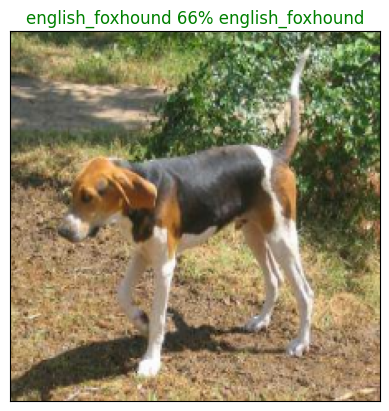

In [77]:
plot_pred(predictions,val_data_labels,val_data_images,42)

<h1 style="color:red">lec 244:-Visualizing And Evaluate Model Predictions 2</h1>

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [78]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob , true_label= prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = predictions[n].argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
              labels=top_10_pred_labels,
              rotation="vertical")

  # Change color of true
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [79]:
predictions[0].argsort()[-10:][::-1]

array([ 70,  26, 103,  17,  79,  73,  59,  35, 109,  65])

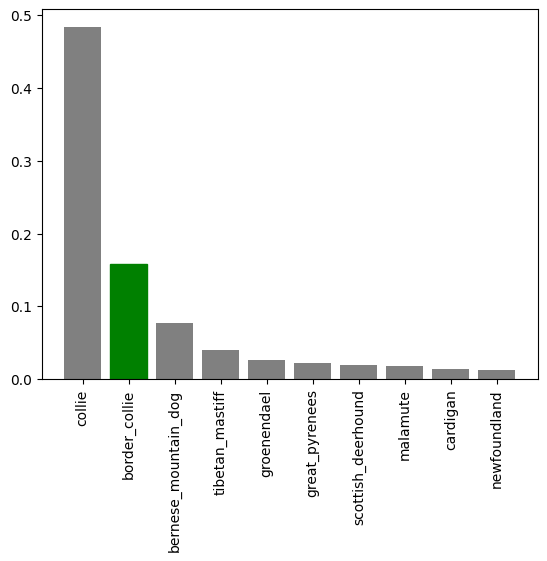

In [80]:
plot_pred_conf(predictions,val_data_labels,9)

<h1 style="color:red">lec 245:-Visualizing And Evaluate Model Predictions 3</h1>

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

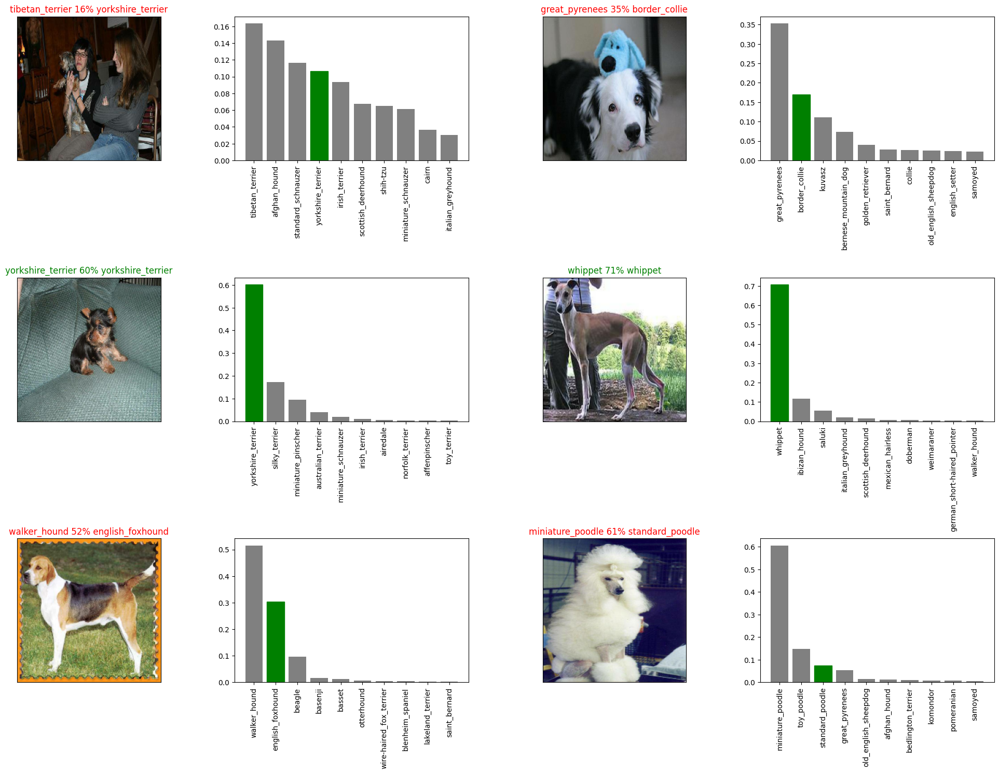

In [81]:
# Let's check out a few predictions and their different values
i_multiplier = 10 # for 6 dogs after 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize =(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions,val_data_labels,val_data_images,i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_data_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How whould you create a confusion matrix with our model predictions and true labels?

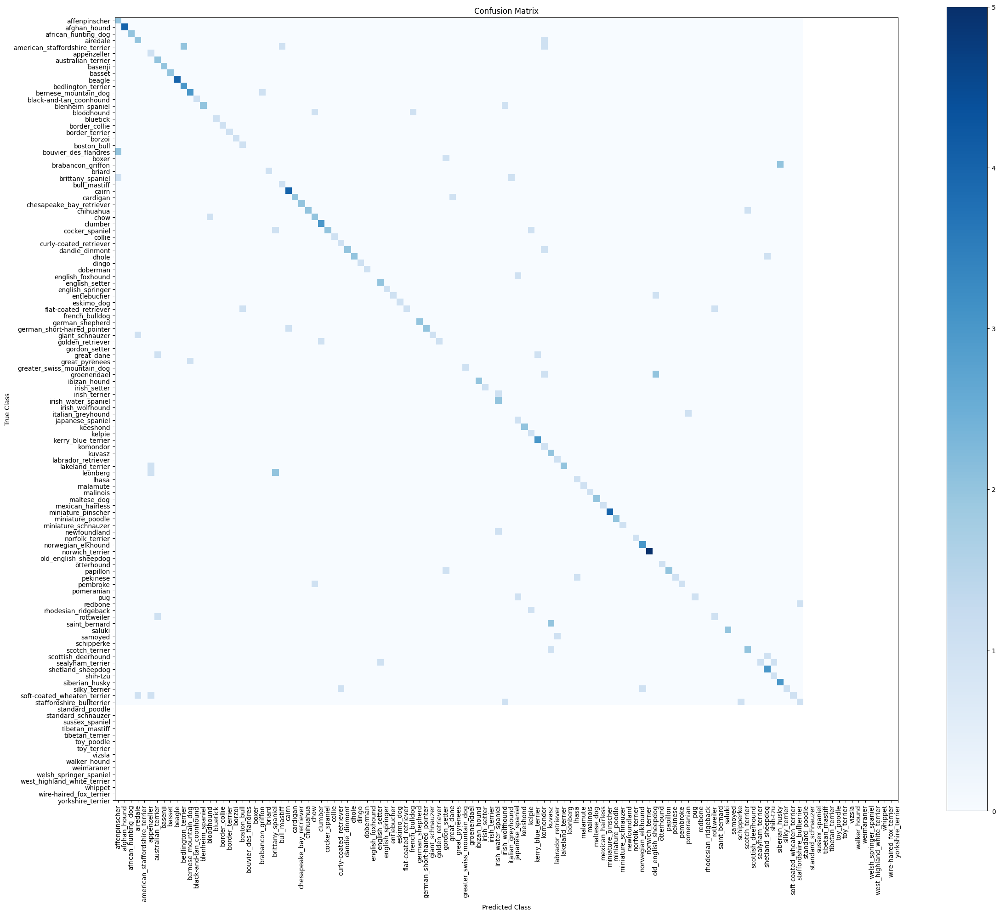

In [82]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# ----------------------------
# Step 1: Convert true labels (strings) → integer indices
# ----------------------------
# Create a mapping: breed string → class index
class_to_index = {breed: i for i, breed in enumerate(unique_breeds)}
# Convert true labels to integer indices
y_true = np.array([class_to_index[label] for label in val_data_labels])

# y_true.shape == (N,)

# ----------------------------
# Step 2: Convert predictions (probabilities) → predicted class indices
# ----------------------------
y_pred = np.argmax(predictions, axis=1)
# y_pred.shape == (N,)

# ----------------------------
# Step 3: Compute confusion matrix
# ----------------------------
cm = confusion_matrix(y_true, y_pred)
# cm.shape == (120, 120)

# ----------------------------
# Step 4 (Optional): Visualize confusion matrix
# ----------------------------
plt.figure(figsize=(24, 20))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
plt.xticks(ticks=np.arange(len(unique_breeds)), labels=unique_breeds, rotation=90)
plt.yticks(ticks=np.arange(len(unique_breeds)), labels=unique_breeds)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.tight_layout()
plt.show()


<h1 style="color:red">lec 246:-Saving And Loading A Trained Model </h1>

## Saving and reloading a model

In [83]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity.
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".keras" # save format of model
  print(f"Saving model:{model.name} to: {model_path}...")
  model.save(model_path)
  return model_path

In [84]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In TensorFlow/Keras, `custom_objects` is used when your model contains **layers, functions, or classes that are not part of standard Keras**.

Here:

```python
model = tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer": hub.KerasLayer})
```

* `hub.KerasLayer` comes from **TensorFlow Hub**.
* It’s a **custom layer** that wraps pre-trained modules (like MobileNet, BERT, etc.).
* Keras does not know about it by default.
* Without `custom_objects`, `load_model` will raise an error because it can’t recognize `KerasLayer`.

`custom_objects` is a dictionary mapping **string names** (used in the saved model) to the actual Python objects. Here:

* `"KerasLayer"` → name of the layer in the saved model
* `hub.KerasLayer` → actual class to use when loading

This allows Keras to reconstruct the model correctly with the TensorFlow Hub layer included.

**Summary:**
You provide `custom_objects` whenever the model contains **non-standard layers or functions** so it can be deserialized correctly.


<hr>
Now we've got functions to save and load a trained model, let's make sure they work!

In [85]:
# Save our model trained on 1000 images
# model_path = save_model(model=modell,suffix="1000-images-mobilenetv2-Adam")

In [86]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog Vision/models/20251221-19521766346747-1000-images-mobilenetv2-Adam.keras")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20251221-19521766346747-1000-images-mobilenetv2-Adam.keras


In [87]:
# Evaluate the pre-saved model
# modell.evaluate(val_data)

In [88]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 106s 14s/step - accuracy: 0.6998 - loss: 1.1505


[1.2307010889053345, 0.6850000023841858]

WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
Saving model to: /content/drive/MyDrive/Dog Vision/models/20251221-19321766345543-1000-images-mobilenetv2-Adam.h5...

why this warning


<hr>
This warning comes from **TensorFlow/Keras** telling you that the **HDF5 (`.h5`) format is legacy**.

* `model.save(..., ".h5")` uses the old **HDF5 format**, which was the default in earlier Keras versions.
* Newer Keras versions recommend using the **native Keras format (`.keras`)**, which is fully compatible with all Keras features, including `custom_objects`, `saved_model` internals, and new layer types.

**Key differences:**

| Format        | Extension | Notes                                                                                    |
| ------------- | --------- | ---------------------------------------------------------------------------------------- |
| HDF5 (legacy) | `.h5`     | Older, widely supported, but some modern Keras features may not serialize perfectly.     |
| Keras native  | `.keras`  | Recommended, fully supports new Keras layers, TensorFlow Hub layers, and custom objects. |

**How to fix the warning:**

```python
model_path = modeldir + "-" + suffix + ".keras"
model.save(model_path)
```

* Everything else in your pipeline stays the same.
* No functionality changes; you just switch to the modern format.

The warning is **informational**, not an error—you can still use `.h5`, but `.keras` is safer for future use.


<h1 style="color:red">lec 247:-Training Model On Full Dataset</h1>

## Training a big dog model (on the full data)

In [89]:
len(X),len(y)

(10222, 10222)

In [90]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)

Creating training data batches...


In [91]:
# Create a model for full model
full_model = create_mobilenet_model()

In [92]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe upto 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [93]:
# # Fit the full model to the full data
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard,full_model_early_stopping])

In [94]:
# full_model_path=save_model(model=full_model,suffix="full-image-set-mobilenetv2-Adam")

In [95]:
# Load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/models/20251221-21071766351259-full-image-set-mobilenetv2-Adam.keras")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20251221-21071766351259-full-image-set-mobilenetv2-Adam.keras


https://github.com/mrdbourke/zero-to-mastery-ml/blob/master/data/dog-vision-prediction-probabilites-array.csv

<h1 style="color:red">lec 248:-Making Predictions On Test Images</h1>

## Making preditcions on test dataset

Since our model has been trained in image in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).

* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [96]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/test"
test_filenames = [test_path + "/" + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/deec3d206b0f5c927c86ed1782990961.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7afb35b8252782013a6700e28e327fa.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e713f150e4f9fc828f8a28705755f199.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e4fc0f20883984209dd64dff54dc89a0.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6a0eeb3e82e14eb812d9ef22383ec11.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e334f758c7944df19c98d49498d28c64.jpg',
 '/content/drive/MyDrive/Dog Vision/test/de90fcd52b9c527ea097d88804985516.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e103930a8a4416f076c81a51907a7512.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e53cb5b42ea1a7700cd294a336890361.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6da14858db7781843db6af91551f627.jpg']

In [97]:
len(test_filenames)

10357

In [98]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data = True)

Creating test data batches...


In [99]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hr).

In [100]:
# # Make predictions on test data batch using the loaded full model
# test_predictions = loaded_full_model.predict(test_data,
#                                              verbose=1)

In [102]:
# # Save predictions (NumPy array) to csv file (for access later)
# np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv",test_predictions,delimeter=",")

downloading those csv files from here:- https://github.com/mrdbourke/zero-to-mastery-ml/blob/master/data/dog-vision-full-model-predictions-with-mobilenetV2.csv

In [103]:
# # Load predictions (Numpy array) from csv file
# test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv",delimeter=",")


<h1 style="color:red">lec 249:-Submitting Model to Kaggle</h1>

## Preparing test dataset prediction for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a Column for each different dog breed. https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle.

In [104]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [106]:
os.path.splitext(test_filenames[0])

('/content/drive/MyDrive/Dog Vision/test/deec3d206b0f5c927c86ed1782990961',
 '.jpg')

In [110]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)] # os.path.splitext(path) gives tuple with first entry path name and another is extension ("path",".jpg")
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,deec3d206b0f5c927c86ed1782990961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7afb35b8252782013a6700e28e327fa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e713f150e4f9fc828f8a28705755f199,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4fc0f20883984209dd64dff54dc89a0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e6a0eeb3e82e14eb812d9ef22383ec11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [114]:
# #Add the prediction probabilities to each dog breed column
# preds_df[list[unique_breeds]] = test_predictions

In [113]:
# # Save our predictions dataframe to CSV for submission to Kaggle
# preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
#                 index=False)

250 - Endtoend Dog Vision Notebook from the videos -> https://github.com/mrdbourke/zero-to-mastery-ml/blob/master/section-4-unstructured-data-projects/end-to-end-dog-vision-video.ipynb

250 - Endtoend Dog Vision Notebook with annotations -> https://github.com/mrdbourke/zero-to-mastery-ml/blob/master/section-4-unstructured-data-projects/end-to-end-dog-vision.ipynb

<h1 style="color:red">lec 250:-Making Predictions On Our Images</h1>

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using
`create_data_batches()`. And since our custom images won't have lebals, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels
* Compare the predicted labels to the custom images.



In [115]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/MyDrive/Dog Vision/my-dog-photos/image1.jfif',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/image2.jfif',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/image3.jfif']

In [116]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [117]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


In [119]:
custom_preds.shape

(3, 120)

In [120]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'saluki', 'golden_retriever']

In [122]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

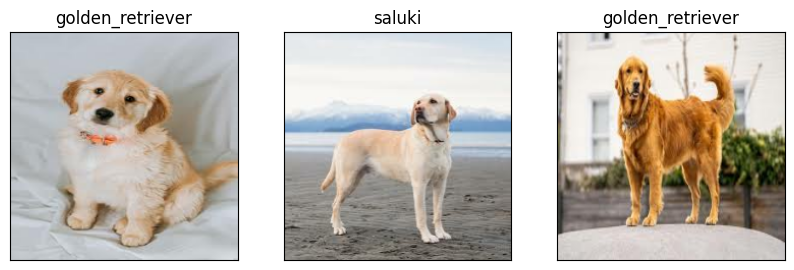

In [123]:
# check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images): # enumerate() takes an iterable and returns pairs of (index, value) while looping.
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

<p>Woah! What an effort. If you've made it this far, you've just gone end-to-end on a multi-class image classification problem. This is the same style of problem self-driving cars have, except with different data.</p><p>You should be proud of yourself. Consider finishing this project a momentum builder for getting started with your next deep learning projects.</p><p>If you're looking for some ideas, you've got plenty of options.</p><p>You could try to improve the full model we trained in this notebook in a few ways (there are a fair few options). Since our early experiment (using only 1000 images) hinted at our model overfitting (the results on the training set far outperformed the results on the validation set), one goal going forward would be to try and prevent it.</p><ol><li><p><a href="https://tfhub.dev/" rel="noopener noreferrer" target="_blank">Trying another model from TensorFlow Hub</a> - Perhaps a different model would perform better on our dataset. One option would be to experiment with a different pre-trained model from TensorFlow Hub or look into the <a href="https://www.tensorflow.org/api_docs/python/tf/keras/applications" rel="noopener noreferrer" target="_blank">tf.keras.applications module</a>.</p></li><li><p><a href="https://bair.berkeley.edu/blog/2019/06/07/data_aug/" rel="noopener noreferrer" target="_blank">Data augmentation</a> - Take the training images and manipulate (crop, resize) or distort them (flip, rotate) to create even more training data for the model to learn from. Check out the <a href="https://www.tensorflow.org/api_docs/python/tf/image" rel="noopener noreferrer" target="_blank">TensorFlow images</a> documentation for a whole bunch of functions you can use on images. A great idea would be to try and replicate the techniques in <a href="https://github.com/google/eng-edu/blob/master/ml/pc/exercises/image_classification_part2.ipynb" rel="noopener noreferrer" target="_blank">this example cat vs. dog image classification notebook</a> for our dog breeds problem.</p></li><li><p><a href="https://www.tensorflow.org/hub/tf2_saved_model#fine-tuning" rel="noopener noreferrer" target="_blank">Fine-tuning</a> - The model we used in this notebook was directly from TensorFlow Hub, we took what it had already learned from another dataset (ImageNet) and applied it to our own. Another option is to use what the model already knows and fine-tune this knowledge to our own dataset (pictures of dogs). This would mean all of the patterns within the model would be updated to be more specific to pictures of dogs rather than general images.</p></li></ol><p>If you're after more, one of the best ways to find out something is to search for something like:</p><ul><li><p>"How to improve a TensorFlow 2.x image classification model?"</p></li><li><p>"TensorFlow 2.x image classification best practices"</p></li><li><p>"Transfer learning for image classification with TensorFlow 2.x"</p></li><li><p>"Deep learning project examples with TensorFlow 2.x"</p></li></ul><p>The TensorFlow developers have even put together <a href="https://www.tensorflow.org/resources/learn-ml" rel="noopener noreferrer" target="_blank">a massive compilation of all of their favourite TensorFlow and machine learning resources</a>.</p><p>When you see an example you think might be beyond your reach (because it looks too complicated), remember <strong>if in doubt, run the code</strong>. Try and reproduce what you see. This is the best way to get hands-on and build your own knowledge.</p><p>No one starts out knowing how to do everything single thing. They just get better are knowing what to look for.</p><p>And remember, if you have any questions, don't forget to send <a href="https://www.twitter.com/mrdbourke" rel="noopener noreferrer" target="_blank">@mrdbourke</a> or <a href="https://twitter.com/AndreiNeagoie" rel="noopener noreferrer" target="_blank">@AndreiNeagoie</a> a message on Twitter or in the Discord chat!</p>